(personal virtual environnement : Data_Science)

# PROJET FIL ROUGE : étude de la gravité des accidents des cyclistes (vélos et VAE) et prévision/optimisation des infrastructures cyclables

**Références**  
    **Défis** :  
    https://defis.data.gouv.fr/defis/infrastructures-cyclables  
    https://github.com/Trustii-team/WAICF-Data-Challenge  
    **Données** :  
    *accidents* :  
    https://www.data.gouv.fr/fr/datasets/bases-de-donnees-annuelles-des-accidents-corporels-de-la-circulation-routiere-annees-de-2005-a-2023/  
    (description-des-bases-de-donnees-annuelles.pdf)        
    https://www.data.gov.uk/dataset/cb7ae6f0-4be6-4935-9277-47e5ce24a11f/road-safety-data  
    *infrastructures cyclables* :  
    https://defis.data.gouv.fr/datasets/60a37b7f303fdf4f2654b73d  
    **Algorithmes existants** :  
    (machine learning (xgboost et random forest) pour prévoir la gravité des accidents de la route)  
    https://larevueia.fr/xgboost-vs-random-forest-predire-la-gravite-dun-accident-de-la-route/      
    https://www.institutdesactuaires.com/docs/mem/d12b93131bcb1627854909ae36064a47.pdf  
    https://www.kaggle.com/code/kanuriviveknag/road-accidents-severity-prediction  
      
**Limitations** : les données n'incluent ni la vitesse des véhicules, ni l'état d'influence des personnes ( données porteraient atteinte à la protection de la vie privée)

In [1]:
import os
from IPython.display import HTML

import numpy as np
import pandas as pd
from datetime import datetime

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
from plotly import subplots
from plotly.offline import plot

import geopandas as gpd
import folium
from folium.plugins import HeatMap

In [2]:
from sklearn.preprocessing import normalize

from sklearn.cluster import KMeans
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import train_test_split, GridSearchCV

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.metrics import recall_score, f1_score

# Datasets

## INFRASTRUCTURES CYCLABLES (not yet implemented)

https://defis.data.gouv.fr/datasets/60a37b7f303fdf4f2654b73d

In [3]:
# LOCALISATION DES INFRASTRUCTURES CYCLABLES
rep = r"data"
file = "france-20241201_corrected.geojson" #"france-20241201.geojson"
#df_pistes =gpd.read_file(os.path.join(rep, file)) 

In [4]:
import json
with open(os.path.join(rep, file)) as f:
    data = json.load(f)


In [14]:
for f in data['features']:
    g = f['geometry']['coordinates']
    if len(g) <2:
        print(f)

## ACCIDENTS

https://www.data.gouv.fr/fr/datasets/bases-de-donnees-annuelles-des-accidents-corporels-de-la-circulation-routiere-annees-de-2005-a-2023/

In [3]:
re2p = r"data"
file_vehicules = "vehicules-2023.csv"
file_usagers = "usagers-2023.csv"
file_lieux  = "lieux-2023.csv"
file_carac = "caract-2023.csv"
df_vehicules = pd.read_csv(os.path.join(re2p, file_vehicules), sep=";")
df_usagers = pd.read_csv(os.path.join(re2p, file_usagers), sep=";")
df_lieux = pd.read_csv(os.path.join(re2p, file_lieux), sep=";")
df_carac = pd.read_csv(os.path.join(re2p, file_carac), sep=";")

C:\Users\thepe\AppData\Local\Temp\ipykernel_27368\481068365.py:8: DtypeWarning:

Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.



In [4]:
df_lieux

,Num_Acc,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
0,202300000001,4,RUE DE RIVOLI,0,NaN,1,2,0,1,-1,-1,1,NaN,-1,2,0,1,30
1,202300000001,4,RUE SAINT FLORENTIN,0,NaN,1,1,0,1,-1,-1,1,NaN,-1,2,0,1,30
2,202300000002,3,120,0,NaN,2,3,2,1,-1,-1,1,NaN,-1,2,0,1,50
3,202300000003,3,5,0,NaN,2,4,0,1,1,0,1,NaN,-1,2,5,1,50
4,202300000003,3,87,0,NaN,2,4,0,1,1,0,1,NaN,-1,2,5,1,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70855,202300054818,4,LA FONTAINE (RUE JEAN DE),0,NaN,2,2,0,1,-1,0,1,NaN,-1,1,0,1,50
70856,202300054819,4,RN3 (ANCIENNE ROUTE),0,NaN,2,2,0,2,0,0,1,NaN,-1,1,0,1,50
70857,202300054820,4,BAMBOU (CHEMIN DE LA RUELLE),0,NaN,2,2,0,2,0,0,2,NaN,-1,1,0,8,30
70858,202300054821,2,ROUTE NATIONALE 1,0,NaN,-1,2,1,1,4,50,1,NaN,-1,1,0,1,90


In [5]:
df_lieux.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70860 entries, 0 to 70859
Data columns (total 18 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Num_Acc  70860 non-null  int64 
 1   catr     70860 non-null  int64 
 2   voie     58113 non-null  object
 3   v1       70860 non-null  int64 
 4   v2       5884 non-null   object
 5   circ     70860 non-null  int64 
 6   nbv      70860 non-null  object
 7   vosp     70860 non-null  int64 
 8   prof     70860 non-null  int64 
 9   pr       70860 non-null  object
 10  pr1      70860 non-null  object
 11  plan     70860 non-null  int64 
 12  lartpc   31 non-null     object
 13  larrout  70860 non-null  object
 14  surf     70860 non-null  int64 
 15  infra    70860 non-null  int64 
 16  situ     70860 non-null  int64 
 17  vma      70860 non-null  int64 
dtypes: int64(11), object(7)
memory usage: 9.7+ MB


**LIEUX:**  
**catr** : 1 – Autoroute; 2 – Route nationale; 3 – Route Départementale; 4 – Voie Communale; 5 – Hors réseau public; 6 – Parc de stationnement ouvert à la circulation publique; 7 – Routes de métropole urbaine; 9 – autre  
**voie** : Numéro de la route.  
**v1** : Indice numérique du numéro de route (exemple : 2 bis, 3 ter etc.).  
**v2** : Lettre indice alphanumérique de la route.  
**circ** : -1 – Non renseigné; 1 – A sens unique; 2 – Bidirectionnelle; 3 – A chaussées séparées; 4 – Avec voies d’affectation variable  
**nbv** : Nombre total de voies de circulation.  
**vosp** : Signale l’existence d’une voie réservée, indépendamment du fait que l’accident ait lieu ou non surcette voie.  
-1 – Non renseigné; 0 – Sans objet; 1 – Piste cyclable; 2 – Bande cyclable; 3 – Voie réservée  
**prof** : Profil en long décrit la déclivité de la route à l'endroit de l'accident :  
-1 – Non renseigné; 1 – Plat; 2 – Pente; 3 – Sommet de côte; 4 – Bas de côte  
**pr** : Numéro du PR de rattachement (numéro de la borne amont). La valeur -1 signifie que le PR n’est pas renseigné.  
**pr1** : Distance en mètres au PR (par rapport à la borne amont). La valeur -1 signifie que le PR n’est pas renseigné.  
**plan** Tracé en plan :  
-1 – Non renseigné; 1 – Partie rectiligne; 2 – En courbe à gauche; 3 – En courbe à droite; 4 – En « S »  
**lartpc** Largeur du terre-plein central (TPC) s'il existe (en m).  
**larrout** Largeur de la chaussée affectée à la circulation des véhicules ne sont pas compris les bandes d'arrêt
d'urgence, les TPC et les places de stationnement (en m).  
**surf** Etat de la surface :  
-1 – Non renseigné; 1 – Normale; 2 – Mouillée; 3 – Flaques; 4 – Inondée; 5 – Enneigée; 6 – Boue; 7 – Verglacée; 8 – Corps gras – huile; 9 – Autre  
**infra** Aménagement - Infrastructure :  
-1 – Non renseigné; 0 – Aucun; 1 – Souterrain - tunnel; 2 – Pont - autopont; 3 – Bretelle d’échangeur ou de raccordement; 4 – Voie ferrée; 5 – Carrefour aménagé; 6 – Zone piétonne; 7 – Zone de péage; 8 – Chantier; 9 – Autres  
**situ** Situation de l’accident :  
-1 – Non renseigné; 0 – Aucun; 1 – Sur chaussée; 2 – Sur bande d’arrêt d’urgence; 3 – Sur accotement; 4 – Sur trottoir; 5 – Sur piste cyclable; 6 – Sur autre voie spéciale; 8 – Autres  
**vma** Vitesse maximale autorisée sur le lieu et au moment de l’accident.

In [6]:
descri_lieux = {'catr':{1:'Autoroute', 2: 'Route nationale', 3:'Route Départementale', 4:'Voie Communale', 5:'Hors réseau public', 6:'Parc de stationnement ouvert à la circulation publique', 7:'Routes de métropole urbaine', 9:'autre'},
                'circ':{1:'Sens unique', 2:'Bidirectionnelle', 3:'À chaussées séparées', 4:'Voies d\'affectation variable'},
                'vosp':{1:'Piste cyclable', 2:'Bande cyclable', 3:'Voie réservée'},
                'prof':{1:'Plat', 2:'Pente', 3 :'Sommet de côte', 4:'Bas de côte'},
                'plan' : {1 :'Partie rectiligne', 2:'En courbe à gauche', 3:'En courbe à droite', 4:'En « S »'},
                'surf' : {1:'Normale', 2:'Mouillée', 3:'Flaques', 4 :'Inondée', 5:'Enneigée', 6:'Boue', 7:'Verglacée', 8:'Corps gras – huile', 9 :'Autre'},
                'infra' : {0 :'Aucun', 1:'Souterrain - tunnel' , 2:'Pont - autopont', 3: 'Bretelle d’échangeur ou de raccordement', 4: 'Voie ferrée', 5:'Carrefour aménagé', 6 :'Zone piétonne', 7 :'Zone de péage', 8:'Chantier', 9 :'Autres'},
                'situ' :{1:'Sur chaussée',  2:'Sur bande d’arrêt d’urgence', 3:'Sur accotement', 4:'Sur trottoir', 5:'Sur piste cyclable', 6:'Sur autre voie spéciale'}
               }


In [7]:
df_carac

,Num_Acc,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,adr,lat,long
0,202300000001,7,5,2023,06:00,1,75,75101,2,4,2,7,RUE DE RIVOLI,"48,86638600","2,32347100"
1,202300000002,7,5,2023,05:30,5,94,94080,2,1,3,6,Avenue de Paris,"48,84547782","2,42868146"
2,202300000003,7,5,2023,20:50,1,94,94022,2,3,2,1,Avenue du Général Leclerc,"48,76240000","2,40655000"
3,202300000004,6,5,2023,23:57,5,94,94078,2,1,3,5,Rue de Paris,"48,73248432","2,44687575"
4,202300000005,7,5,2023,00:50,5,94,94068,2,2,3,3,56bis Avenue Raspail,"48,78581000","2,49217000"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54817,202300054818,26,10,2023,20:45,5,974,97416,2,1,1,6,LA FONTAINE (RUE JEAN DE),"-21,33828000","55,47771000"
54818,202300054819,26,10,2023,19:10,3,974,97416,1,1,1,3,RN3 (ANCIENNE ROUTE),"-21,28865000","55,50994000"
54819,202300054820,26,10,2023,09:40,1,974,97411,2,1,1,7,BAMBOU (CHEMIN DE LA RUELLE),"-20,90129000","55,40598000"
54820,202300054821,26,10,2023,17:20,1,973,97302,1,6,1,3,ROUTE NATIONALE 1,"4,89713000","-52,32854000"


In [8]:
df_carac['lat'] = df_carac['lat'].apply(lambda x : float(x.replace(',', '.')))
df_carac['long'] = df_carac['long'].apply(lambda x : float(x.replace(',', '.')))                                        

In [9]:
df_carac.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54822 entries, 0 to 54821
Data columns (total 15 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   Num_Acc  54822 non-null  int64  
 1   jour     54822 non-null  int64  
 2   mois     54822 non-null  int64  
 3   an       54822 non-null  int64  
 4   hrmn     54822 non-null  object 
 5   lum      54822 non-null  int64  
 6   dep      54822 non-null  object 
 7   com      54822 non-null  object 
 8   agg      54822 non-null  int64  
 9   int      54822 non-null  int64  
 10  atm      54822 non-null  int64  
 11  col      54822 non-null  int64  
 12  adr      53433 non-null  object 
 13  lat      54822 non-null  float64
 14  long     54822 non-null  float64
dtypes: float64(2), int64(9), object(4)
memory usage: 6.3+ MB


**CARACTERISTIQUES:**  
**lum** : 1 – Plein jour; 2 – Crépuscule ou aube; 3 – Nuit sans éclairage public; 4 – Nuit avec éclairage public non allumé; 5 – Nuit avec éclairage public allumé  
**agg** : 1 – Hors agglomération ; 2 – En agglomération  
**in**t : 1 – Hors intersection; 2 – Intersection en X; 3 – Intersection en T; 4 – Intersection en Y; 5 – Intersection à plus de 4 branches; 6 – Giratoire; 7 – Place; 8 – Passage à niveau ; 9 – Autre intersection  
**atm** : -1 – Non renseigné ; 1 – Normale; 2 – Pluie légère; 3 – Pluie forte; 4 – Neige - grêle; 5 – Brouillard - fumée; 6 – Vent fort - tempête; 7 – Temps éblouissant; 8 – Temps couvert; 9 – Autre  
**col** : -1 – Non renseigné; 1 – Deux véhicules - frontale; 2 – Deux véhicules – par l’arrière; 3 – Deux véhicules – par le coté; 4 – Trois véhicules et plus – en chaîne; 5 – Trois véhicules et plus - collisions multiples; 6 – Autre collision; 7 – Sans collision 


In [10]:
descri_carac = {'lum' : {1 :'Plein jour', 2 :'Crépuscule ou aube', 3 : 'Nuit sans éclairage public', 4 : 'Nuit avec éclairage public non allumé', 5 : 'Nuit avec éclairage public allumé'},
                'agg' : {1 : 'Hors agglomération', 2 : 'En agglomération'},
                'int' : {1 : 'Hors intersection', 2 : 'Intersection en X', 3 : 'Intersection en T', 4 : 'Intersection en Y', 5 : 'Intersection à plus de 4 branches', 6 : 'Giratoire', 7 : 'Place', 8 : 'Passage à niveau', 9 : 'Autre intersection'},
                'atm' : {1  : 'Normale', 2 : 'Pluie légère', 3 : 'Pluie forte', 4 : 'Neige - grêle', 5 : 'Brouillard - fumée', 6 : 'Vent fort - tempête', 7 : 'Temps éblouissant', 8 : 'Temps couvert', 9 : 'Autre'},
                'col' : {1 : 'Deux véhicules - frontale', 2 : 'Deux véhicules – par l’arrière', 3 : 'Deux véhicules – par le coté', 4 : 'Trois véhicules et plus – en chaîne', 5 : 'Trois véhicules et plus - collisions multiples', 6 : 'Autre collision', 7 : 'Sans collision' },
               }


In [11]:
df_vehicules

,Num_Acc,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,occutc
0,202300000001,155 680 557,A01,1,30,0,0,5,1,1,NaN
1,202300000002,155 680 556,A01,2,7,0,1,1,1,1,NaN
2,202300000003,155 680 554,B01,1,2,0,2,1,16,1,NaN
3,202300000003,155 680 555,A01,2,7,0,2,2,15,1,NaN
4,202300000004,155 680 551,B01,1,7,0,2,9,2,4,NaN
...,...,...,...,...,...,...,...,...,...,...,...
93580,202300054820,155 583 348,A01,3,7,0,9,4,26,1,NaN
93581,202300054821,155 583 346,A01,1,30,0,2,3,9,1,NaN
93582,202300054821,155 583 347,B01,1,7,0,2,2,9,1,NaN
93583,202300054822,155 583 344,A01,2,7,0,2,7,22,1,NaN


In [12]:
df_vehicules.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 93585 entries, 0 to 93584
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Num_Acc      93585 non-null  int64  
 1   id_vehicule  93585 non-null  object 
 2   num_veh      93585 non-null  object 
 3   senc         93585 non-null  int64  
 4   catv         93585 non-null  int64  
 5   obs          93585 non-null  int64  
 6   obsm         93585 non-null  int64  
 7   choc         93585 non-null  int64  
 8   manv         93585 non-null  int64  
 9   motor        93585 non-null  int64  
 10  occutc       838 non-null    float64
dtypes: float64(1), int64(8), object(2)
memory usage: 7.9+ MB


**VEHICULES**  
**id_vehicule**: Identifiant unique du véhicule repris pour chacun des usagers occupant ce véhicule (y compris les
piétons qui sont rattachés aux véhicules qui les ont heurtés) – Code numérique.  
**Num_Veh**: Identifiant du véhicule repris pour chacun des usagers occupant ce véhicule (y compris les piétons qui
sont rattachés aux véhicules qui les ont heurtés) – Code alphanumérique.  
**senc**: Sens de circulation :  
-1 – Non renseigné; 0 – Inconnu; 1 – PK ou PR ou numéro d’adresse postale croissant; 2 – PK ou PR ou numéro d’adresse postale décroissant; 3 – Absence de repère  
**catv**: Catégorie du véhicule :
00 – Indéterminable; 01 – Bicyclette; 02 – Cyclomoteur <50cm3; ... ; 50 – EDP à moteur; 60 – EDP sans moteur; 80 – VAE; 99 – Autre véhicule  
**obs**: Obstacle fixe heurté :  
-1 – Non renseigné; 0 – Sans objet; 1 – Véhicule en stationnement; 2 – Arbre ; ...  
**obsm**: Obstacle mobile heurté :
-1 – Non renseigné; 0 – Aucun; 1 – Piéton; 2 – Véhicule; 4 – Véhicule sur rail; 5 – Animal domestique; 6 – Animal sauvage; 9 – Autre  
**choc**: Point de choc initial :
-1 – Non renseigné; 0 – Aucun; 1 – Avant; 2 – Avant droit; 3 – Avant gauche; 4 – Arrière; 5 – Arrière droit; 6 – Arrière gauche; 7 – Côté droit; 8 – Côté gauche; 9 – Chocs multiples (tonneaux)  
**manv**: ***Manoeuvre principale avant l’accident*** -1 – Non renseigné; 0 – Inconnue; 1 – Sans changement de direction; 2 – Même sens, même file; 3 – Entre 2 files; 4 – En marche arrière; 5 – A contresens; 6 – En franchissant le terre-plein central; 7 – Dans le couloir bus, dans le même sens; 8 – Dans le couloir bus, dans le sens inverse; 9 – En s’insérant; 10 – En faisant demi-tour sur la chaussée  
 ***Changeant de file*** 11 – A gauche; 12 – A droite; ***Déporté*** 13 – A gauche; 14 – A droite; ***Tournant*** 15 – A gauche; 16 – A droite; ***Dépassant*** 17 – A gauche; 18 – A droite ***Divers*** 19 – Traversant la chaussée; 20 – Manœuvre de stationnement; 21 – Manœuvre d’évitement; 22 – Ouverture de porte; 23 – Arrêté (hors stationnement); 24 – En stationnement (avec occupants); 25 – Circulant sur trottoir; 26 – Autres manœuvres  
**motor**: Type de motorisation du véhicule :  
-1 – Non renseigné; 0 – Inconnue; 1 – Hydrocarbures; 2 – Hybride électrique; 3 – Electrique; 4 – Hydrogène; 5 – Humaine; 6 – Autre  
**occutc**: Nombre d’occupants dans le transport en commun.

In [13]:
descri_vehicules = {'catv' : {1:'Bicyclette', 2:'Cyclomoteur <50cm3', 3:'Voiturette', 7:'VL seul', 8:'(VL + caravane)', 9:'(VL + remorque)',
                              10:'VU seul 1,5T <= PTAC <= 3,5T avec ou sans remorque',11:'(VU (10) + caravane)', 12:'(VU (10) + remorque)',
                              13:'PL seul 3,5T <PTCA <= 7,5T', 14 :'PL seul > 7,5T', 15 :'PL > 3,5T + remorque', 16 :'Tracteur routier seul',
                              17 :'Tracteur routier + semi-remorque', 18 :'(transport en commun)', 19:'(tramway)',20:'Engin spécial', 21:'Tracteur agricole',
                              30 :'Scooter < 50 cm3', 31:'Motocyclette > 50 cm3 et <= 125 cm3', 32:'Scooter > 50 cm3 et <= 125 cm3', 33:'Motocyclette > 125 cm3',
                              34 :'Scooter > 125 cm3', 35:'Quad léger <= 50 cm3', 36:'Quad lourd > 50 cm3',37:'Autobus', 38:'Autocar', 39:'Train', 40:'Tramway',
                              41:'3RM <= 50 cm3', 42:'3RM > 50 cm3 <= 125 cm3', 43:'3RM > 125 cm3', 50:'EDP à moteur', 60:'EDP sans moteur', 80:'VAE',
                              99 :'Autre véhicule'},
                    'obs' : {1 : 'Véhicule en stationnement', 2 : 'Arbre', 3 : 'Glissière métallique', 4 : 'Glissière béton', 5 : 'Autre glissière', 6 : 'Bâtiment, mur, pile de pont',
                             7 : 'Support de signalisation verticale ou poste d’appel d’urgence', 8 : 'Poteau', 9 : 'Mobilier urbain', 10 : 'Parapet', 11 : 'Ilot, refuge, borne haute',
                             12 : 'Bordure de trottoir', 13 : 'Fossé, talus, paroi rocheuse', 14 : 'Autre obstacle fixe sur chaussée', 15 : 'Autre obstacle fixe sur trottoir ou accotement',
                             16 : 'Sortie de chaussée sans obstacle', 17 : 'Buse – tête d’aqueduc'},
                    'obsm' : {0 : 'Aucun', 1 : 'Piéton', 2 : 'Véhicule', 4 : 'Véhicule sur rail', 5 : 'Animal domestique', 6 : 'Animal sauvage', 9 : 'Autre'},
                    'choc' : {0 : 'Aucun', 1 : 'Avant', 2 : 'Avant droit', 3 : 'Avant gauche', 4 : 'Arrière', 5 : 'Arrière droit', 6 : 'Arrière gauche', 7 : 'Côté droit', 8 : 'Côté gauche', 9 : 'Chocs multiples (tonneaux)'},
                    'manv' : {1 : 'Sans changement de direction', 2 : 'Même sens, même file', 3 : 'Entre 2 files', 4 : 'En marche arrière', 5 : 'A contresens', 6 : 'En franchissant le terre-plein central',
                              7 : 'Dans le couloir bus, dans le même sens', 8 : 'Dans le couloir bus, dans le sens inverse', 9 : 'En s’insérant', 10 : 'En faisant demi-tour sur la chaussée',
                              11 : 'Changeant de file à gauche', 12 : 'Changeant de file à droite', 13 : 'Déporté à gauche', 14 : 'Déporté à droite',  15 : 'Tournant à gauche', 16 :  'Tournant à droite',
                              17 : 'Dépassant à gauche', 18 : 'Dépassant à droite', 19 : 'Traversant la chaussée', 20 : 'Manœuvre de stationnement', 21 : 'Manœuvre d’évitement',
                              22 : 'Ouverture de porte', 23 : 'Arrêté (hors stationnement)', 24 : 'En stationnement (avec occupants)', 25 : 'Circulant sur trottoir', 26 : 'Autres manœuvres'},
                    'motor' : {1 : 'Hydrocarbures', 2 : 'Hybride électrique', 3 : 'Electrique', 4 : 'Hydrogène', 5 : 'Humaine', 6 : 'Autre'}
                    }


In [14]:
df_usagers

,Num_Acc,id_usager,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202300000001,203 851 184,155 680 557,A01,1,1,4,1,1978.0,5,2,0,-1,-1,-1,-1
1,202300000002,203 851 182,155 680 556,A01,1,1,1,2,1997.0,9,1,0,-1,-1,-1,-1
2,202300000002,203 851 183,155 680 556,A01,10,3,3,1,1997.0,9,0,-1,-1,2,3,1
3,202300000003,203 851 180,155 680 554,B01,1,1,3,1,1987.0,0,2,6,0,0,0,-1
4,202300000003,203 851 181,155 680 555,A01,1,1,1,2,1984.0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125784,202300054821,203 720 720,155 583 346,A01,1,1,4,1,1971.0,1,2,0,-1,0,0,-1
125785,202300054821,203 720 721,155 583 347,B01,1,1,1,2,1968.0,1,1,0,-1,0,0,-1
125786,202300054822,203 720 717,155 583 344,A01,2,2,1,2,2003.0,2,1,-1,-1,-1,-1,-1
125787,202300054822,203 720 718,155 583 344,A01,1,1,1,2,2002.0,1,1,-1,-1,-1,-1,-1


In [15]:
df_usagers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 125789 entries, 0 to 125788
Data columns (total 16 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Num_Acc      125789 non-null  int64  
 1   id_usager    125789 non-null  object 
 2   id_vehicule  125789 non-null  object 
 3   num_veh      125789 non-null  object 
 4   place        125789 non-null  int64  
 5   catu         125789 non-null  int64  
 6   grav         125789 non-null  int64  
 7   sexe         125789 non-null  int64  
 8   an_nais      123191 non-null  float64
 9   trajet       125789 non-null  int64  
 10  secu1        125789 non-null  int64  
 11  secu2        125789 non-null  int64  
 12  secu3        125789 non-null  int64  
 13  locp         125789 non-null  int64  
 14  actp         125789 non-null  object 
 15  etatp        125789 non-null  int64  
dtypes: float64(1), int64(11), object(4)
memory usage: 15.4+ MB


**USAGERS**  
**id_usager** : Identifiant unique de l’usager (y compris les piétons qui sont rattachés aux véhicules qui les ont
heurtés) – Code numérique.  
**id_vehicule** : Identifiant unique du véhicule repris pour chacun des usagers occupant ce véhicule (y compris les
piétons qui sont rattachés aux véhicules qui les ont heurtés) – Code numérique.  
**num_Veh** : Identifiant du véhicule repris pour chacun des usagers occupant ce véhicule (y compris les piétons qui
sont rattachés aux véhicules qui les ont heurtés) – Code alphanumérique.  
**place** : Permet de situer la place occupée dans le véhicule par l'usager au moment de l'accident  
**catu** : Catégorie d'usager : 1 – Conducteur; 2 – Passager; 3 – Piéton  
**grav** : Gravité de blessure de l'usager, les usagers accidentés sont classés en trois catégories de victimes plus les indemnes :  
1 – Indemne; 2 – Tué; 3 – Blessé hospitalisé; 4 – Blessé léger  
**sexe** : 1 – Masculin; 2 – Féminin  
**An_nais** : Année de naissance de l'usager.  
**trajet** : Motif du déplacement au moment de l’accident :  
-1 – Non renseigné; 0 – Non renseigné; 1 – Domicile – travail; 2 – Domicile – école; 3 – Courses – achats; 4 – Utilisation professionnelle; 5 – Promenade – loisirs; 9 – Autre  

Les équipements de sécurité jusqu’en 2018 étaient en 2 variables : existence et utilisation.
A partir de 2019, il s’agit de l’utilisation avec jusqu’à 3 équipements possibles pour un même usager
(notamment pour les motocyclistes dont le port du casque et des gants est obligatoire).  

**secu1** : Le renseignement du caractère indique la présence et l’utilisation de l’équipement de sécurité :  
-1 – Non renseigné; 0 – Aucun équipement; 1 – Ceinture; 2 – Casque; 3 – Dispositif enfants; 4 – Gilet réfléchissant; 5 – Airbag (2RM/3RM); 6 – Gants (2RM/3RM); 7 – Gants + Airbag (2RM/3RM); 8 – Non déterminable; 9 – Autre  
**secu2**  
**secu3**  
**locp** Localisation du piéton : -1 – Non renseigné; 0 – Sans objet; ***Sur chaussée*** : 1 – A + 50 m du passage piéton; 2 – A – 50 m du passage piéton; ***Sur passage piéton*** :3 – Sans signalisation lumineuse; 4 – Avec signalisation lumineuse; ***Divers*** : 5 – Sur trottoir; 6 – Sur accotement; 7 – Sur refuge ou BAU; 8 – Sur contre allée; 9 – Inconnue  
**actp** Action du piéton :
-1 – Non renseigné; ***Se déplaçant*** 0 – Non renseigné ou sans objet; 1 – Sens véhicule heurtant; 2 – Sens inverse du véhicule; ***Divers*** 3 – Traversant; 4 – Masqué; 5 – Jouant – courant; 6 – Avec animal; 9 – Autre; A – Monte/descend du véhicule; B – Inconnue  
**etatp** Cette variable permet de préciser si le piéton accidenté était seul ou non :  
-1 – Non renseigné; 1 – Seul; 2 – Accompagné; 3 – En groupe  

In [16]:
descri_usagers = {'catu' : {1 : 'Conducteur', 2 : 'Passager', 3 : 'Piéton'},
                  'grav' : {1 : 'Indemne', 2 : 'Tué', 3 : 'Blessé hospitalisé', 4 : 'Blessé léger'},
                  'sexe' : {1 : 'Masculin', 2 : 'Féminin'},
                  #'An_nais' : Année de naissance de l'usager.
                  'trajet' : {1 : 'Domicile – travail', 2 : 'Domicile – école', 3 : 'Courses – achats', 4 : 'Utilisation professionnelle', 5 : 'Promenade – loisirs', 9 : 'Autre'},
                  'secu1' : {0 : 'Aucun équipement', 1 : 'Ceinture', 2 : 'Casque', 3 : 'Dispositif enfants', 4 : 'Gilet réfléchissant', 5 : 'Airbag (2RM/3RM)', 6  : 'Gants (2RM/3RM)',
                             7 : 'Gants + Airbag (2RM/3RM)', 8 : 'Non déterminable',  9 : 'Autre'},
                  'locp' : {1 : 'Sur chaussée à + 50 m du passage piéton', 2 : 'Sur chaussée à – 50 m du passage piéton', 3 : 'Sur passage piéton sans signalisation lumineuse',
                            4 : 'Sur passage piéton avec signalisation lumineuse', 5 : 'Sur trottoir', 6 : 'Sur accotement', 7 : 'Sur refuge ou BAU', 8 : 'Sur contre allée',
                            9 : 'Inconnue'},
                  'actp' : {1 : 'Déplace dans sens véhicule heurtant', 2 : 'Déplace dans sens inverse du véhicule', 3 : 'Traversant', 4 : 'Masqué', 5 : 'Jouant – courant',
                            6 : 'Avec animal', 9 : 'Autre', 'A' : 'Monte/descend du véhicule', 'B' : 'Inconnue'},
                  'etatp' : {1 : 'Seul', 2 : 'Accompagné', 3 : 'En groupe'}
                 }
                                                                 

**Un accident n'a qu'1 CARAC mais peut avoir plusieurs LIEUX, plusieurs VEHICULES et plusieurs USAGERS**

### Jointure des tables

<img src="Images/Jointure_tables_accidents_fr.png" width="800" height="400">

**=> TARGET : USAGERS.grav**

### Accident en particulier

In [16]:
num_acci = 202300000012

df1c = df_carac[df_carac['Num_Acc']==num_acci]
df1c

,Num_Acc,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,adr,lat,long
11,202300000012,6,5,2023,11:15,1,93,93051,2,3,8,3,Rue du Docteur Vaillant / A4,48.83611,2.5646


In [17]:
df1l = df_lieux[df_lieux['Num_Acc']==num_acci]
df1l

,Num_Acc,catr,voie,v1,v2,circ,nbv,vosp,prof,pr,pr1,plan,lartpc,larrout,surf,infra,situ,vma
16,202300000012,1,DOCTEUR VAILLANT,0,NaN,1,1,0,2,14,0,1,NaN,-1,1,3,1,50
17,202300000012,1,DOCTEUR VAILLANT,0,NaN,4,2,0,2,0,0,1,NaN,-1,1,0,1,50


In [18]:
df1v = df_vehicules[df_vehicules['Num_Acc']==num_acci]
df1v

,Num_Acc,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,occutc
20,202300000012,155 680 536,B01,2,36,0,2,2,1,1,NaN
21,202300000012,155 680 537,A01,3,33,0,2,0,0,1,NaN


In [19]:
df1u = df_usagers[df_usagers['Num_Acc']==num_acci]
df1u

,Num_Acc,id_usager,id_vehicule,num_veh,place,catu,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
29,202300000012,203 851 154,155 680 536,B01,1,1,1,1,2003.0,5,1,-1,-1,-1,-1,-1
30,202300000012,203 851 155,155 680 537,A01,1,1,4,1,1982.0,5,2,6,-1,-1,-1,-1


# DataSet TOTAL

## Concaténation

In [57]:
# Les personnes rattachées à leur véhicule
df_entites = pd.merge(df_vehicules, df_usagers,on = ['Num_Acc', 'id_vehicule', 'num_veh'])
df_entites

,Num_Acc,id_vehicule,num_veh,senc,catv,obs,obsm,choc,manv,motor,...,grav,sexe,an_nais,trajet,secu1,secu2,secu3,locp,actp,etatp
0,202300000001,155 680 557,A01,1,30,0,0,5,1,1,...,4,1,1978.0,5,2,0,-1,-1,-1,-1
1,202300000002,155 680 556,A01,2,7,0,1,1,1,1,...,1,2,1997.0,9,1,0,-1,-1,-1,-1
2,202300000002,155 680 556,A01,2,7,0,1,1,1,1,...,3,1,1997.0,9,0,-1,-1,2,3,1
3,202300000003,155 680 554,B01,1,2,0,2,1,16,1,...,3,1,1987.0,0,2,6,0,0,0,-1
4,202300000003,155 680 555,A01,2,7,0,2,2,15,1,...,1,2,1984.0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
125784,202300054821,155 583 346,A01,1,30,0,2,3,9,1,...,4,1,1971.0,1,2,0,-1,0,0,-1
125785,202300054821,155 583 347,B01,1,7,0,2,2,9,1,...,1,2,1968.0,1,1,0,-1,0,0,-1
125786,202300054822,155 583 344,A01,2,7,0,2,7,22,1,...,1,2,2003.0,2,1,-1,-1,-1,-1,-1
125787,202300054822,155 583 344,A01,2,7,0,2,7,22,1,...,1,2,2002.0,1,1,-1,-1,-1,-1,-1


In [58]:
# les caractéristiques des accidents rattachés à leur(s) lieu(x) : un accident peut avoir plusieurs lieux (intersections...)
df_accidents = pd.merge(df_carac, df_lieux, on ='Num_Acc')

In [59]:
# Dataset total : attention, il peut donc y avoir plusieurs lignes (lieux) pour une même victime, qui a quand même un identifiant unique
df_total = pd.merge(df_entites, df_accidents, on = 'Num_Acc')

In [60]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 163683 entries, 0 to 163682
Data columns (total 55 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Num_Acc      163683 non-null  int64  
 1   id_vehicule  163683 non-null  object 
 2   num_veh      163683 non-null  object 
 3   senc         163683 non-null  int64  
 4   catv         163683 non-null  int64  
 5   obs          163683 non-null  int64  
 6   obsm         163683 non-null  int64  
 7   choc         163683 non-null  int64  
 8   manv         163683 non-null  int64  
 9   motor        163683 non-null  int64  
 10  occutc       2726 non-null    float64
 11  id_usager    163683 non-null  object 
 12  place        163683 non-null  int64  
 13  catu         163683 non-null  int64  
 14  grav         163683 non-null  int64  
 15  sexe         163683 non-null  int64  
 16  an_nais      160171 non-null  float64
 17  trajet       163683 non-null  int64  
 18  secu1        163683 non-

In [61]:
# Nombre d'accidents répertoriés dans le dataset avant nettoyage
df_total['Num_Acc'].nunique()

54822

## Nettoyage

In [62]:
# catégories non intéressantes ou avec trop de valeurs manquantes
categ_out = ['num_veh', 'senc', 'occutc', 'locp', 'actp','etatp', 'adr', 'secu2', 'secu3', 'voie', 'v1', 'v2', 'pr', 'pr1', 'lartpc', 'larrout']

df_total = df_total.drop(columns=categ_out)

# accidents dont certaines lignes contiennent des infos manquantes
df_acci_incomplet = df_total[df_total.isna().any(axis=1)]['Num_Acc'].unique()

df_total = df_total[~df_total['Num_Acc'].isin(list(df_acci_incomplet))]

# les valeurs -1 correspondent aussi à des valeurs manquantes
df_total = df_total[(df_total != -1).all(axis=1)]
df_total = df_total[(df_total != '-1').all(axis=1)]
df_total = df_total[(df_total != ' -1').all(axis=1)] # nbv
df_total = df_total[(df_total != "#VALEURMULTI").all(axis=1)] # nbv


# target en categorical ?
#df_total['grav'] = df_total['grav'].astype('category')

df_total


,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,catr,circ,nbv,vosp,prof,plan,surf,infra,situ,vma
0,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,4,1,2,0,1,1,2,0,1,30
1,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,4,1,1,0,1,1,2,0,1,30
2,202300000002,155 680 556,7,0,1,1,1,1,203 851 182,1,...,3,2,3,2,1,1,2,0,1,50
3,202300000002,155 680 556,7,0,1,1,1,1,203 851 183,10,...,3,2,3,2,1,1,2,0,1,50
4,202300000003,155 680 554,2,0,2,1,16,1,203 851 180,1,...,3,2,4,0,1,1,2,5,1,50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163676,202300054820,155 583 348,7,0,9,4,26,1,203 720 722,1,...,4,2,2,0,2,2,1,0,8,30
163677,202300054820,155 583 348,7,0,9,4,26,1,203 720 723,2,...,4,2,2,0,2,2,1,0,8,30
163680,202300054822,155 583 344,7,0,2,7,22,1,203 720 717,2,...,4,2,2,2,1,1,1,0,5,30
163681,202300054822,155 583 344,7,0,2,7,22,1,203 720 718,1,...,4,2,2,2,1,1,1,0,5,30


155355

In [63]:
# Nombre d'accidents répertoriés dans le dataset après nettoyage
df_total['Num_Acc'].nunique()

47708

**On est passé de 54 822 à 47 708 accidents répertoriés**

In [28]:
df_total.columns

Index(['Num_Acc', 'id_vehicule', 'num_veh', 'catv', 'obs', 'obsm', 'choc',
       'manv', 'motor', 'id_usager', 'place', 'catu', 'grav', 'sexe',
       'an_nais', 'trajet', 'secu1', 'secu2', 'secu3', 'jour', 'mois', 'an',
       'hrmn', 'lum', 'dep', 'com', 'agg', 'int', 'atm', 'col', 'lat', 'long',
       'catr', 'circ', 'nbv', 'vosp', 'prof', 'plan', 'larrout', 'surf',
       'infra', 'situ', 'vma', 'day_of_week', 'gravity'],
      dtype='object')

In [66]:
for col in df_total.columns:
    print(col, df_total[col].nunique())

Num_Acc 47708
id_vehicule 81397
catv 31
obs 18
obsm 7
choc 10
manv 27
motor 7
id_usager 109408
place 10
catu 3
grav 4
sexe 2
an_nais 106
trajet 7
secu1 9
jour 31
mois 12
an 1
hrmn 1392
lum 5
dep 107
com 10792
agg 2
int 9
atm 9
col 7
lat 46303
long 46455
catr 8
circ 4
nbv 13
vosp 4
prof 4
plan 4
surf 9
infra 10
situ 7
vma 17


In [67]:
for col in df_total.columns:
    if df_total[col].nunique()<100:
        print(df_total.value_counts(col))

catv
7     82279
10     9368
33     9091
1      5743
2      4182
50     2920
30     2851
32     2275
31     2036
37     1484
34     1169
15      961
80      912
14      845
43      782
3       699
38      685
99      560
17      555
13      488
21      276
60      265
36      215
40      181
39       56
20       51
0        50
16       49
35       43
42       35
41       24
Name: count, dtype: int64
obs
0     111027
1       2790
13      2559
2       2222
4       1842
6       1741
3       1706
8       1694
12      1191
14       904
9        765
15       751
16       647
7        512
5        247
11       225
10       168
17       139
Name: count, dtype: int64
obsm
2    88397
0    23639
1    16872
9     1831
6      161
4      136
5       94
Name: count, dtype: int64
choc
1    48446
3    20817
2    18167
4    10884
8     9039
7     7592
0     6316
6     4299
5     3743
9     1827
Name: count, dtype: int64
manv
1     57544
2     13145
15    12450
0      7160
13     5280
16     4107
9      

In [68]:
# vma : corriger les valeurs qui ne se terminent pas par 0 ou 5
def new_vma(x):
    if str(x)!='0' or str(x)!='5':
        return round(x)
    else:
        return x
df_total['vma']=df_total['vma'].apply(new_vma)

In [69]:
# Number of the day in the week

def dayweek(an, mois, jour):
    return datetime(an,mois,jour).weekday()

df_total['day_of_week'] = df_total.apply(lambda x : dayweek(x.an, x.mois,x.jour), axis=1)

In [70]:
# Rename category of gravity for better comprehension
grav = {1 : 'Indemne', 2 : 'Tué', 3 : 'Blessé hospitalisé', 4 : 'Blessé léger'}
df_total['gravity']=df_total['grav'].apply(lambda x: grav[x])
df_total

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
0,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,2,0,1,1,2,0,1,30,6,Blessé léger
1,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,1,0,1,1,2,0,1,30,6,Blessé léger
2,202300000002,155 680 556,7,0,1,1,1,1,203 851 182,1,...,3,2,1,1,2,0,1,50,6,Indemne
3,202300000002,155 680 556,7,0,1,1,1,1,203 851 183,10,...,3,2,1,1,2,0,1,50,6,Blessé hospitalisé
4,202300000003,155 680 554,2,0,2,1,16,1,203 851 180,1,...,4,0,1,1,2,5,1,50,6,Blessé hospitalisé
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163676,202300054820,155 583 348,7,0,9,4,26,1,203 720 722,1,...,2,0,2,2,1,0,8,30,3,Blessé léger
163677,202300054820,155 583 348,7,0,9,4,26,1,203 720 723,2,...,2,0,2,2,1,0,8,30,3,Blessé léger
163680,202300054822,155 583 344,7,0,2,7,22,1,203 720 717,2,...,2,2,1,1,1,0,5,30,4,Indemne
163681,202300054822,155 583 344,7,0,2,7,22,1,203 720 718,1,...,2,2,1,1,1,0,5,30,4,Indemne


In [74]:
# df_total.to_csv("data/df_total_2023.csv", sep=";", index=False)

## DataSet des cyclistes

In [72]:
# Dataset des accidents ne concernant que les cyclistes (vélos et VAE)
liste_cyclistes = list(df_total[df_total['catv'].isin([1, 80])]['Num_Acc'].unique())
df_cyclistes = df_total[df_total['Num_Acc'].isin(liste_cyclistes)]
df_cyclistes

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
64,202300000017,155 680 527,1,0,2,1,13,5,203 851 138,1,...,2,0,1,1,2,0,1,30,6,Blessé léger
65,202300000017,155 680 528,7,0,9,1,15,1,203 851 139,1,...,2,0,1,1,2,0,1,30,6,Indemne
86,202300000025,155 680 513,1,0,0,0,2,5,203 851 119,1,...,2,0,1,1,1,0,1,50,5,Blessé léger
87,202300000025,155 680 514,15,0,0,0,2,1,203 851 120,1,...,2,0,1,1,1,0,1,50,5,Indemne
88,202300000026,155 680 511,7,0,2,2,17,1,203 851 117,1,...,2,0,1,1,1,0,1,50,6,Indemne
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
163385,202300054723,155 583 506,1,0,2,8,13,5,203 720 944,1,...,2,2,1,2,1,0,5,30,4,Blessé léger
163501,202300054760,155 583 441,1,0,2,1,1,5,203 720 849,1,...,2,0,1,1,1,0,1,50,2,Blessé hospitalisé
163502,202300054760,155 583 443,7,0,2,2,15,1,203 720 852,1,...,2,0,1,1,1,0,1,50,2,Indemne
163623,202300054797,155 583 385,7,0,2,1,1,1,203 720 769,1,...,2,0,1,1,1,0,1,30,1,Indemne


In [75]:
# df_cyclistes.to_csv('data/df_cyclistes_2023.csv', sep=';', index=False)

# STATISTIQUES

In [76]:
# nb d'accidents avec au moins 1 cycliste impliqué :
df_cyclistes['Num_Acc'].nunique()

4652

In [77]:
# nb de vélos/VAE impliqués
df_cyclistes[df_cyclistes['catv'].isin([1, 80])]['id_vehicule'].nunique()

4849

In [78]:
# Nb de cyclistes impliqués :
df_cyclistes[df_cyclistes['catv'].isin([1, 80])]['id_usager'].nunique()

5164

In [79]:
# nb de véhicules par accident
df_nb_vehicules = df_cyclistes.groupby('Num_Acc', as_index=False)['id_vehicule'].nunique()

# liste des accidents où il y a au moins 2 véhicules
vehicule_multiple = list(df_nb_vehicules[df_nb_vehicules['id_vehicule']>1]['Num_Acc'].unique())
# liste des accidents avec un seul cycliste, sans autre véhicule
cycliste_seul = list(df_nb_vehicules[df_nb_vehicules['id_vehicule']==1]['Num_Acc'].unique())

# nb de cyclistes impliqués dans des accidents avec d'autres véhicules
print('cyclistes avec autres véhicules : ', len(vehicule_multiple))

print('cyclistes seuls : ', len(cycliste_seul))

cyclistes avec autres véhicules :  3875
cyclistes seuls :  777


## Graphiques

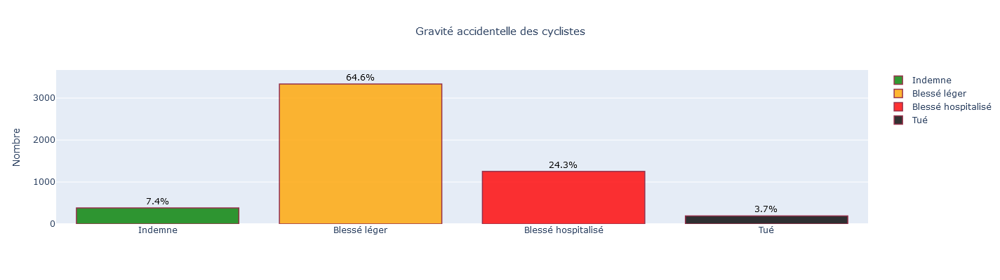

In [80]:
# Gravité des accidents des cyclistes
df1 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()

fig = px.histogram(df1, x='gravity',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   title="Gravité accidentelle des cyclistes", text_auto=False)

# Calcul des pourcentages
counts = df1['gravity'].value_counts()
total = len(df1)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_layout(width=600, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégorie",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                  title = dict(font=dict(size=15), x=0.5)
)

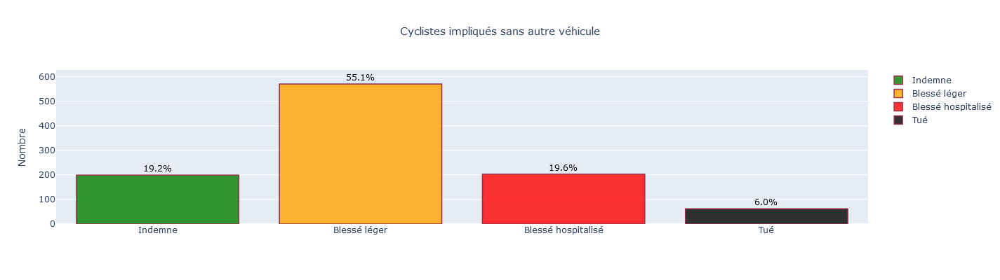

In [83]:
# Gravité des accidents des cyclistes impliqués sans autre véhicule

# les cyclistes seuls impliqués dans des accidents 
df1b = df_cyclistes[(df_cyclistes['Num_Acc'].isin(cycliste_seul)) & (df_cyclistes['catv'].isin([1, 80]))].groupby('id_usager', as_index=False).first()

fig = px.histogram(df1b, x='gravity',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   title="Cyclistes impliqués sans autre véhicule",
                   text_auto=False)

# Calcul des pourcentages
counts = df1b['gravity'].value_counts()
total = len(df1b)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_layout(width=600, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégorie",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                  title = dict(font=dict(size=15), x=0.5)
)

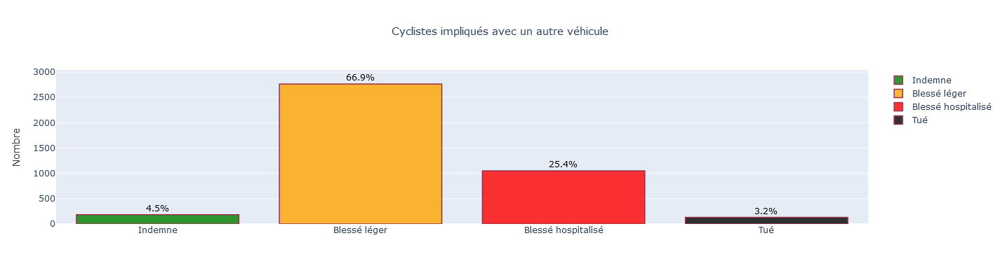

In [84]:
# Gravité des accidents des cyclistes impliqués avec un autre véhicule

# les cyclistes dans des accidents impliquant au moins 2 véhicules
df2 = df_cyclistes[(df_cyclistes['Num_Acc'].isin(vehicule_multiple)) & (df_cyclistes['catv'].isin([1, 80]))].groupby('id_usager', as_index=False).first()

fig = px.histogram(df2, x='gravity',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   title="Cyclistes impliqués avec un autre véhicule",
                   text_auto=False)

# Calcul des pourcentages
counts = df2['gravity'].value_counts()
total = len(df2)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_layout(width=600, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégorie",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                  title = dict(font=dict(size=15), x=0.5)
)

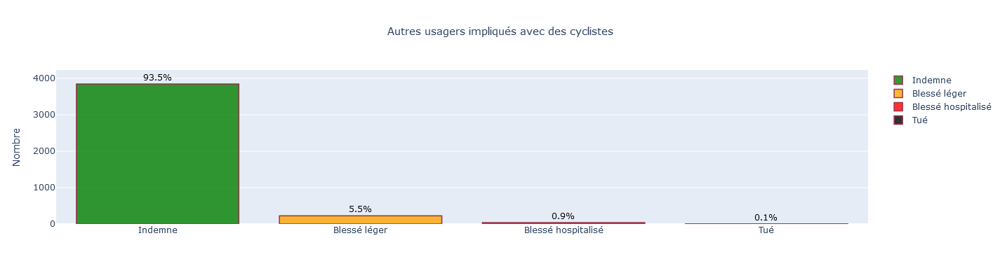

In [85]:
# Gravité des accidents des autres usagers impliqués avec des cyclistes (y compris piétons)

df3 = df_cyclistes[(df_cyclistes['Num_Acc'].isin(vehicule_multiple)) & (~df_cyclistes['catv'].isin([1, 80]))].groupby('id_usager', as_index=False).first()

fig = px.histogram(df3, x='gravity',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   title="Autres usagers impliqués avec des cyclistes", text_auto=False)

# Calcul des pourcentages
counts = df3['gravity'].value_counts()
total = len(df3)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_layout(width=600, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

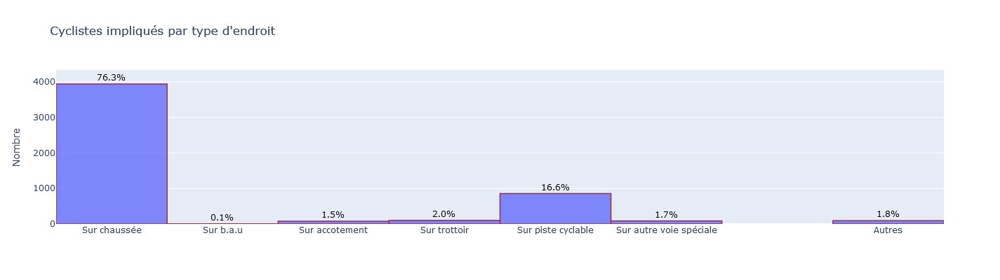

In [86]:
# Cyclistes par type d'endroit : problème : plusieurs lieux pour un même accident (interserctions) : d'où légère différence suivant aggrégation : first, max

df4 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()

fig = px.histogram(df4, x='situ', title="Cyclistes par type d'endroit", text_auto=False)

# Calcul des pourcentages
counts = df4['situ'].value_counts()
total = len(df4)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_xaxes(tickmode="array", tickvals = [-1,0,1,2,3,4,5, 6, 8], ticktext= ['Inconnu','Aucun','Sur chaussée',  'Sur b.a.u', 'Sur accotement', 'Sur trottoir', 'Sur piste cyclable', 'Sur autre voie spéciale', 'Autres'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=False,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Cyclistes impliqués par type d\'endroit')
fig.show()

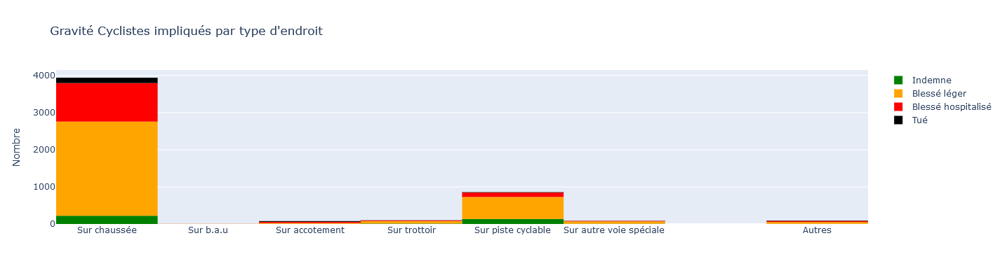

In [87]:
df6 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()

fig = px.histogram(df6, x='situ', title="Cyclistes par type d'endroit",
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1,0,1,2,3,4,5, 6, 8], ticktext= ['Inconnu','Aucun','Sur chaussée',  'Sur b.a.u', 'Sur accotement', 'Sur trottoir', 'Sur piste cyclable', 'Sur autre voie spéciale', 'Autres'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Gravité Cyclistes impliqués par type d\'endroit')
fig.show()

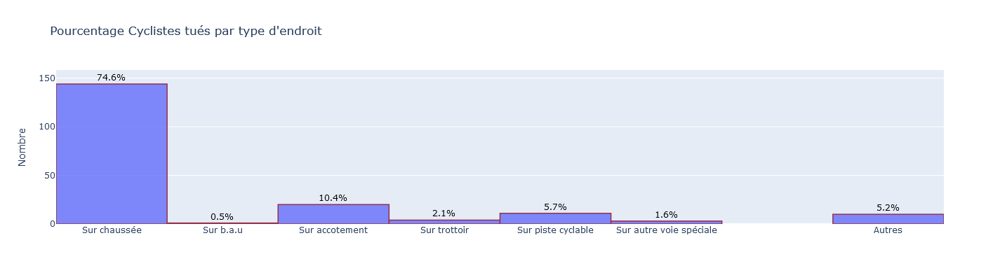

In [88]:
# Cyclistes par type d'endroit

df5 = df_cyclistes[(df_cyclistes['catv'].isin([1, 80])) & (df_cyclistes['grav']==2)].groupby('id_usager', as_index=False).max()

fig = px.histogram(df5, x='situ', title="Cyclistes tués par type d'endroit", text_auto=False)

# Calcul des pourcentages
counts = df5['situ'].value_counts()
total = len(df5)
percentages = (counts / total * 100).sort_index()

# Ajout des annotations de pourcentages
for cat, percentage in percentages.items():
    fig.add_annotation(
        x=cat,
        y=counts[cat],  # Hauteur correspondante
        text=f"{percentage:.1f}%",
        showarrow=False,
        yshift=10,  # Décalage vertical pour la lisibilité
        font=dict(color="black", size=12)
    )

# Mise en forme
fig.update_traces(textfont_size=12, textposition='outside', hovertemplate='%{x}<br>%{y}<br>',
                  marker_line_color= '#800020', marker_line_width=1.5,
                  opacity=0.8)
fig.update_xaxes(tickmode="array", tickvals = [-1,0,1,2,3,4,5, 6, 8], ticktext= ['Inconnu','Aucun','Sur chaussée',  'Sur b.a.u', 'Sur accotement', 'Sur trottoir', 'Sur piste cyclable', 'Sur autre voie spéciale', 'Autres'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=False,                  
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Pourcentage Cyclistes tués par type d\'endroit')
fig.show()

**16.6% des cyclistes impliqués dans un accident le sont sur piste cyclable, mais parmi les tués ils ne sont que 5.7%.  
Inversement, sur accotement, les cyclistes impliqués dans des accidents sont à peine de 1.5%, alors qu'ils représentent 10.4% des tués.**

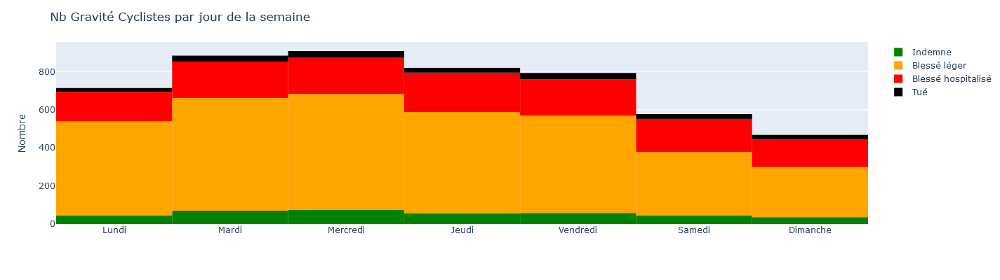

In [89]:
df7 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()

fig = px.histogram(df7, x='day_of_week',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)

fig.update_xaxes(tickmode="array", tickvals = [0,1,2,3,4,5,6], ticktext= ['Lundi','Mardi','Mercredi',  'Jeudi', 'Vendredi', 'Samedi', 'Dimanche'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Jour",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par jour de la semaine')
fig.show()

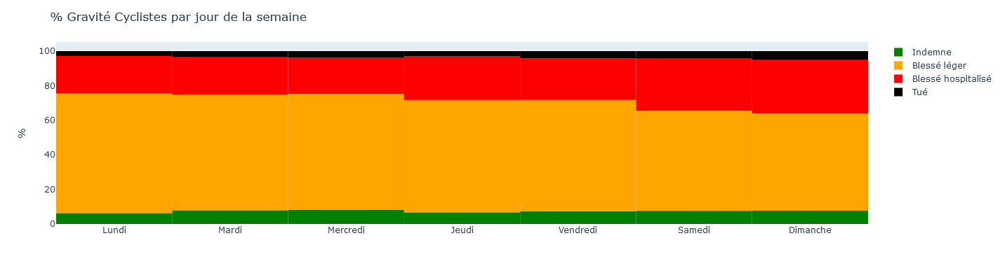

In [90]:
df7 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()

fig = px.histogram(df7, x='day_of_week',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [0,1,2,3,4,5,6], ticktext= ['Lundi','Mardi','Mercredi',  'Jeudi', 'Vendredi', 'Samedi', 'Dimanche'])

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Jour",
                  xaxis_title=None,
                  showlegend=True,
                   legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par jour de la semaine')
fig.show()

**Moins d'accidents le week-end mais des gravités plus conséquentes**

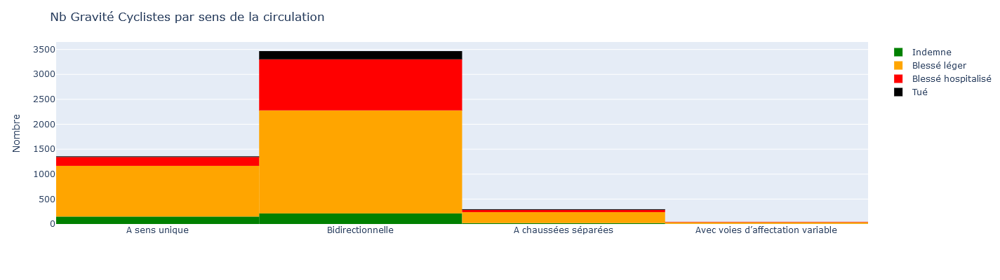

In [91]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='circ',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4], ticktext= ['Non renseigné', 'A sens unique','Bidirectionnelle','A chaussées séparées',  'Avec voies d’affectation variable'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par sens de la circulation')
fig.show()

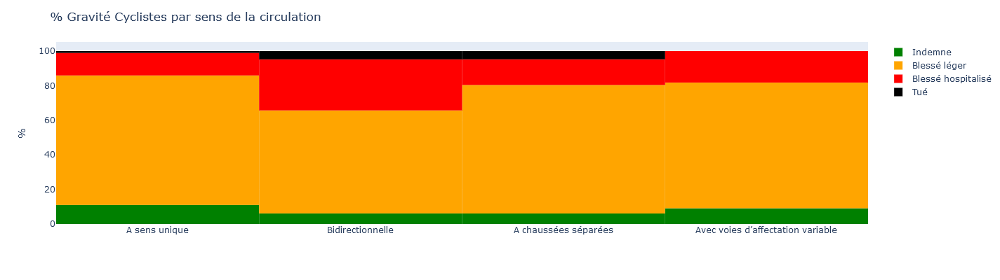

In [92]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='circ',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4], ticktext= ['Non renseigné', 'A sens unique','Bidirectionnelle','A chaussées séparées',  'Avec voies d’affectation variable'])

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par sens de la circulation')
fig.show()

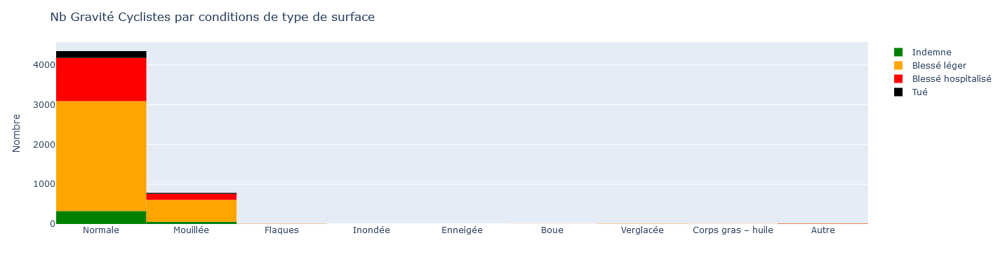

In [93]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='surf', 
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7,8,9], ticktext= ['Non renseigné','Normale', 'Mouillée', 'Flaques', 'Inondée', 'Enneigée', 'Boue', 'Verglacée', 'Corps gras – huile', 'Autre'])
fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title="Nb Gravité Cyclistes par conditions de type de surface")
fig.show()

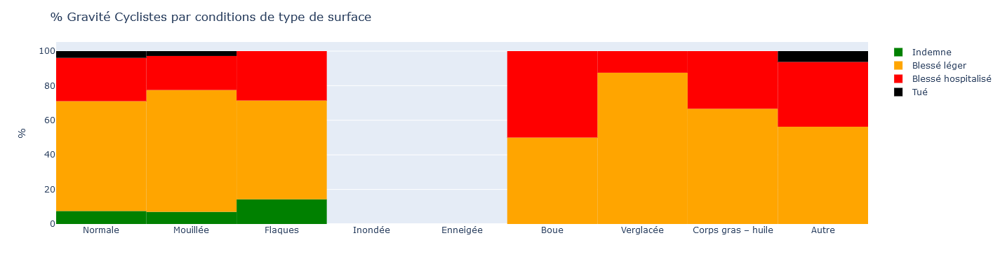

In [94]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='surf',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7,8,9], ticktext= ['Non renseigné','Normale', 'Mouillée', 'Flaques', 'Inondée', 'Enneigée', 'Boue', 'Verglacée', 'Corps gras – huile', 'Autre'])
fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title="% Gravité Cyclistes par conditions de type de surface",)
fig.show()

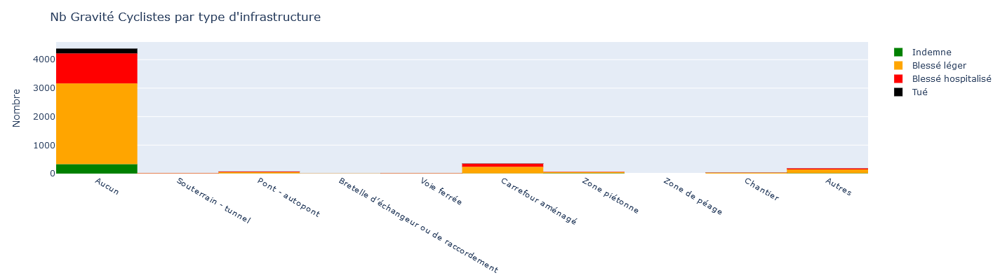

In [95]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='infra',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 0,1,2,3,4,5,6,7,8,9], ticktext= ['Non renseigné', 'Aucun', 'Souterrain - tunnel', 'Pont - autopont', 'Bretelle d’échangeur ou de raccordement', 'Voie ferrée',
                                                                                  'Carrefour aménagé', 'Zone piétonne', 'Zone de péage', 'Chantier', 'Autres'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par type d\'infrastructure')
fig.show()

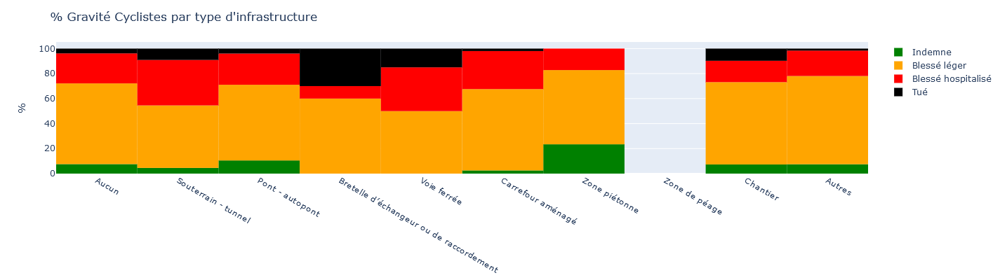

In [96]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).first()
fig = px.histogram(df8, x='infra',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 0,1,2,3,4,5,6,7,8,9], ticktext= ['Non renseigné', 'Aucun', 'Souterrain - tunnel', 'Pont - autopont', 'Bretelle d’échangeur ou de raccordement', 'Voie ferrée',
                                                                                  'Carrefour aménagé', 'Zone piétonne', 'Zone de péage', 'Chantier', 'Autres'])

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  #xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par type d\'infrastructure')
fig.show()

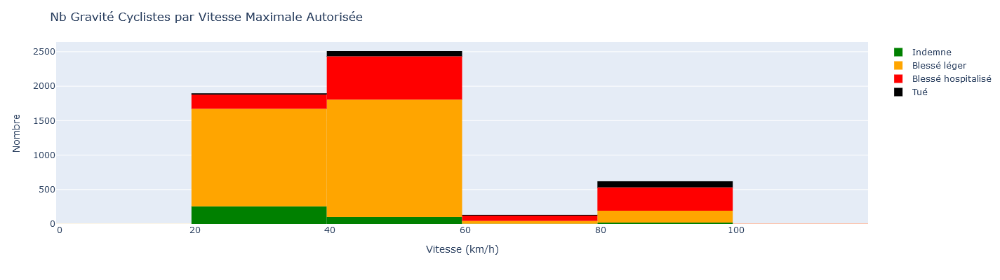

In [97]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()
fig = px.histogram(df8, x='vma',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   nbins=10,
                   #barnorm='percent',
                   text_auto=False)                                                                                

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  xaxis_title="Vitesse (km/h)",
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par Vitesse Maximale Autorisée')
fig.show()

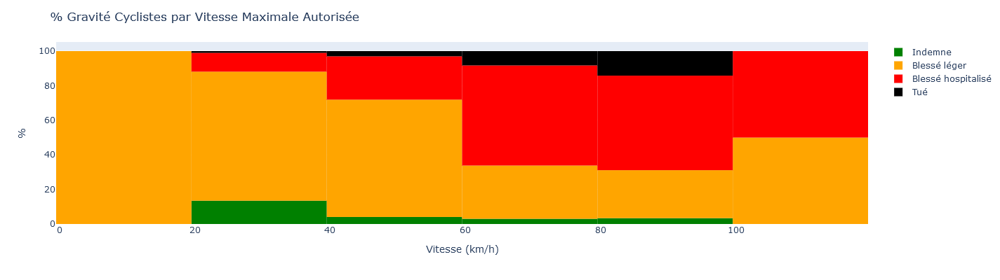

In [98]:
df8 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()
fig = px.histogram(df8, x='vma',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   nbins=10,
                   barnorm='percent',
                   text_auto=False)

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  xaxis_title="Vitesse (km/h)",
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par Vitesse Maximale Autorisée')
fig.show()

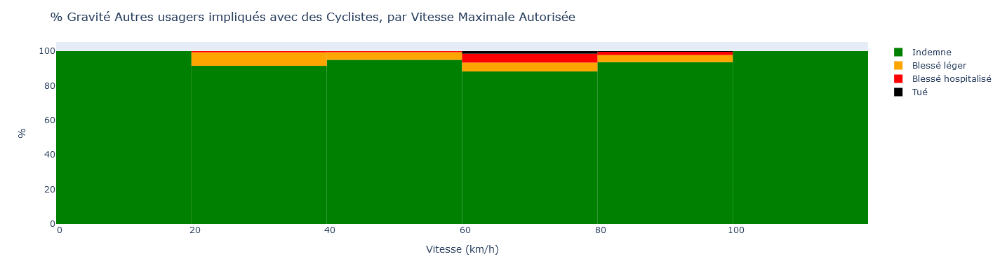

In [99]:
df_autres = df_cyclistes[~df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()
fig = px.histogram(df_autres, x='vma',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   nbins=10,
                   barnorm='percent',
                   text_auto=False)

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  xaxis_title="Vitesse (km/h)",
                  showlegend=True,
                  legend_title_text="",
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Autres usagers impliqués avec des Cyclistes, par Vitesse Maximale Autorisée')
fig.show()

**Plus la vitesse maximale autorisée augmente, plus les conséquences sont graves pour les cyclistes**  
**ce qui n'est pas forcément le cas pour les autres usagers impliqués avec des cyclistes**

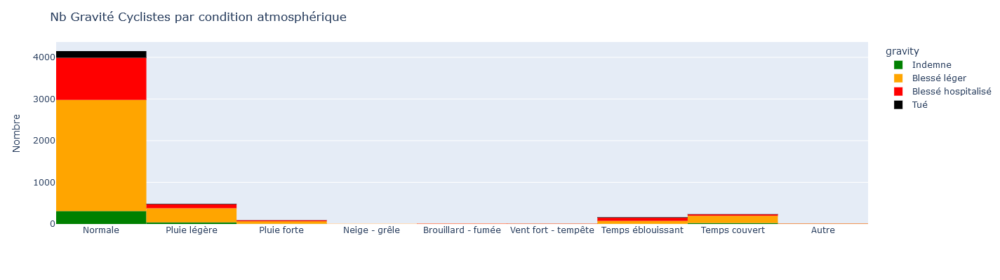

In [100]:
fig = px.histogram(df8, x='atm',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7,8,9],
                 ticktext= ['Non renseigné', 'Normale', 'Pluie légère', 'Pluie forte', 'Neige - grêle', 'Brouillard - fumée', 'Vent fort - tempête', 'Temps éblouissant', 'Temps couvert', 'Autre'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par condition atmosphérique')
fig.show()

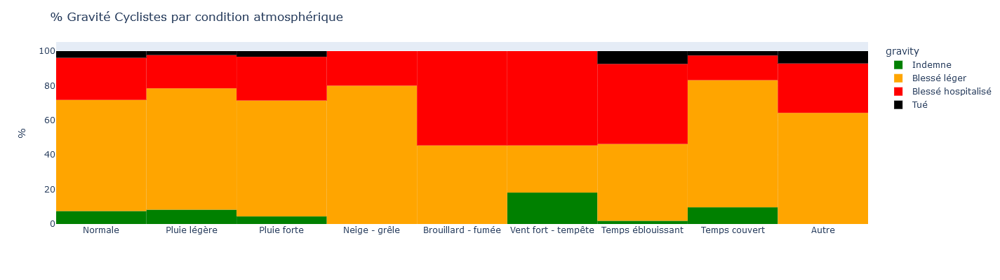

In [101]:
fig = px.histogram(df8, x='atm',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7,8,9],
                 ticktext= ['Non renseigné', 'Normale', 'Pluie légère', 'Pluie forte', 'Neige - grêle', 'Brouillard - fumée', 'Vent fort - tempête', 'Temps éblouissant', 'Temps couvert', 'Autre'])

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par condition atmosphérique')
fig.show()

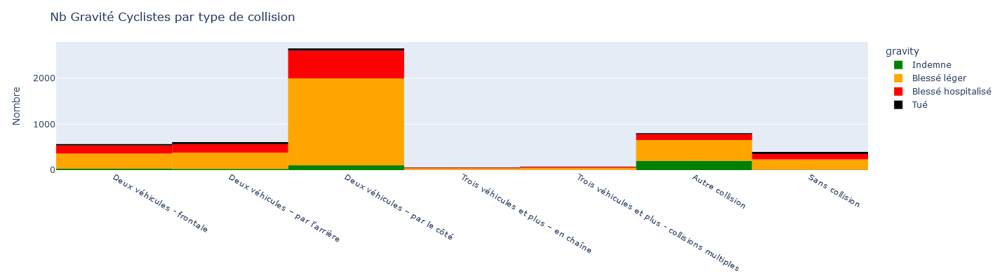

In [102]:
fig = px.histogram(df8, x='col',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7],
                 ticktext= ['Non renseigné', 'Deux véhicules - frontale', 'Deux véhicules – par l’arrière', 'Deux véhicules – par le côté', 'Trois véhicules et plus – en chaîne',
                            'Trois véhicules et plus - collisions multiples', 'Autre collision', 'Sans collision'])


fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes par type de collision')
fig.show()

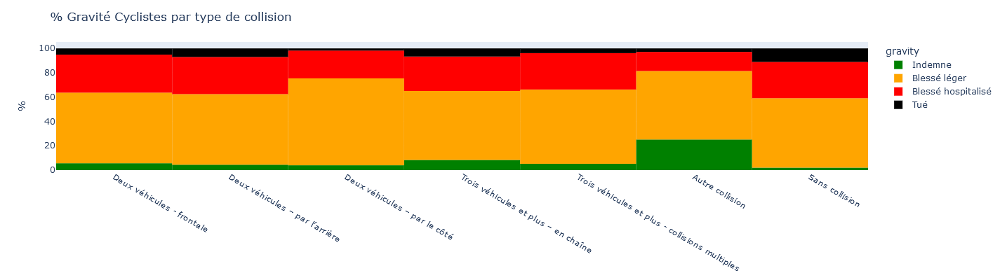

In [103]:
fig = px.histogram(df8, x='col',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [-1, 1,2,3,4,5,6,7],
                 ticktext= ['Non renseigné', 'Deux véhicules - frontale', 'Deux véhicules – par l’arrière', 'Deux véhicules – par le côté', 'Trois véhicules et plus – en chaîne',
                            'Trois véhicules et plus - collisions multiples', 'Autre collision', 'Sans collision'])


fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes par type de collision')
fig.show()

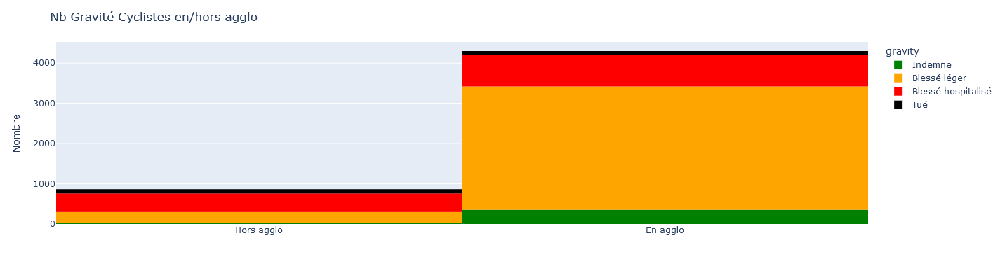

In [104]:
fig = px.histogram(df8, x='agg',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2],
                 ticktext= ['Hors agglo', 'En agglo'])


fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes en/hors agglo')
fig.show()

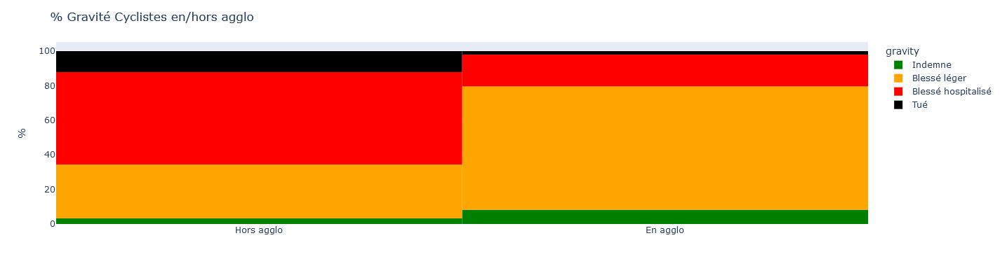

In [105]:
fig = px.histogram(df8, x='agg',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2],
                 ticktext= ['Hors agglo', 'En agglo'])


fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes en/hors agglo')
fig.show()

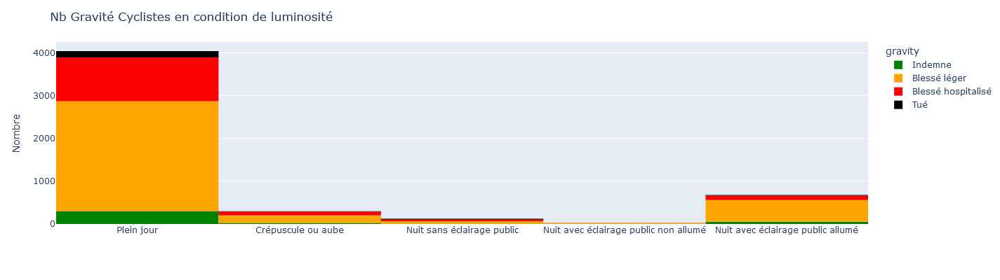

In [106]:
fig = px.histogram(df8, x='lum',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2,3,4,5],
                 ticktext= ['Plein jour', 'Crépuscule ou aube', 'Nuit sans éclairage public', 'Nuit avec éclairage public non allumé', 'Nuit avec éclairage public allumé'])


fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes en condition de luminosité')
fig.show()

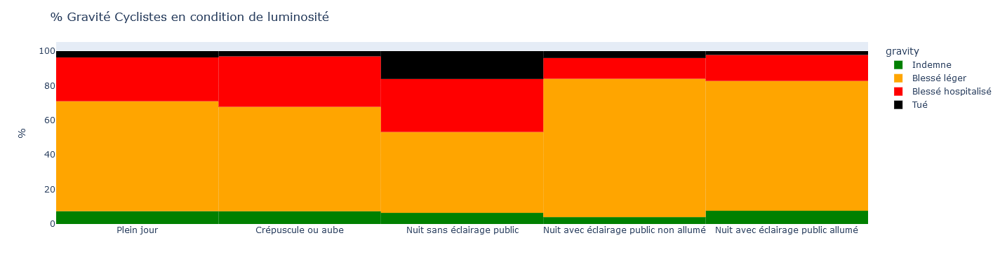

In [107]:
fig = px.histogram(df8, x='lum',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2,3,4,5],
                 ticktext= ['Plein jour', 'Crépuscule ou aube', 'Nuit sans éclairage public', 'Nuit avec éclairage public non allumé', 'Nuit avec éclairage public allumé'])


fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes en condition de luminosité')
fig.show()

**Danger la nuit sans éclairage**

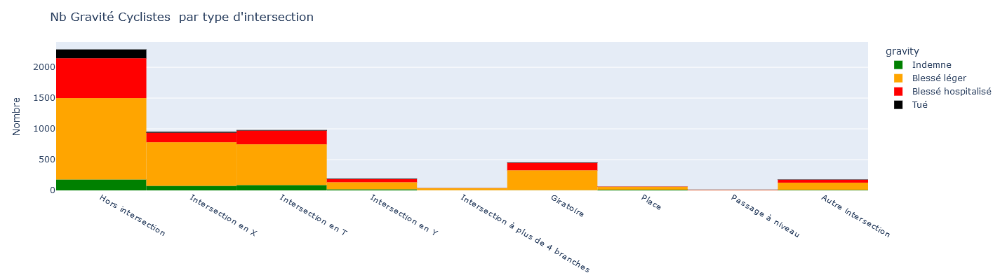

In [108]:
fig = px.histogram(df8, x='int',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   #barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2,3,4,5,6,7,8,9],
                 ticktext= ['Hors intersection', 'Intersection en X', 'Intersection en T', 'Intersection en Y',
                            'Intersection à plus de 4 branches', 'Giratoire', 'Place', 'Passage à niveau', 'Autre intersection'])

fig.update_layout(width=800, height=400,
                  yaxis_title="Nombre",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='Nb Gravité Cyclistes  par type d\'intersection')
fig.show()

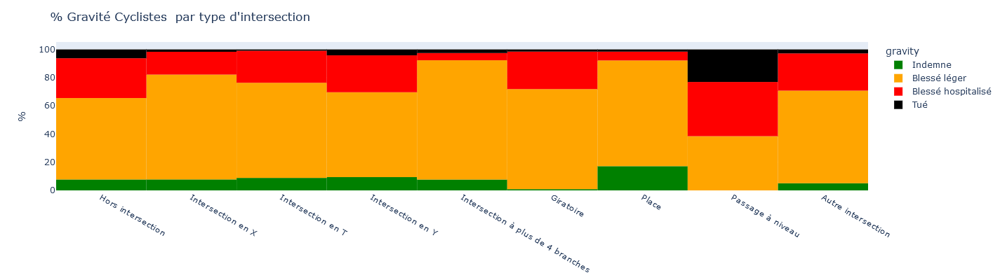

In [109]:
fig = px.histogram(df8, x='int',
                   color='gravity',
                   color_discrete_map = {'Indemne':'green', 'Blessé léger': 'orange', 'Blessé hospitalisé': 'red', 'Tué': 'black' },
                   category_orders={'gravity':['Indemne', 'Blessé léger', 'Blessé hospitalisé', 'Tué']},
                   barnorm='percent',
                   text_auto=False)


fig.update_xaxes(tickmode="array", tickvals = [1,2,3,4,5,6,7,8,9],
                 ticktext= ['Hors intersection', 'Intersection en X', 'Intersection en T', 'Intersection en Y',
                            'Intersection à plus de 4 branches', 'Giratoire', 'Place', 'Passage à niveau', 'Autre intersection'])

fig.update_layout(width=800, height=400,
                  yaxis_title="%",
                  # xaxis_title="Catégories",
                  xaxis_title=None,
                  showlegend=True,
                   title = dict(font=dict(size=15), x=0.5)
)

fig.update_layout(title='% Gravité Cyclistes  par type d\'intersection')
fig.show()

In [66]:
# Pour  : manv, trajet : du cycliste ou de l'éventuel autre usager impliqué ?

# Le mort sur la b.a.u

In [110]:
# 1 cycliste est mort sur la b.a.u !? 
df_beta = df_cyclistes[(df_cyclistes['grav']==2) & (df_cyclistes['situ']==2)]
HTML(df_beta.to_html())

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,catu,grav,sexe,an_nais,trajet,secu1,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,lat,long,catr,circ,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
85414,202300028713,155 629 644,80,0,2,4,23,3,203 783 152,1,1,2,1,1964.0,0,8,16,12,2023,02:45,3,22,22278,1,1,1,2,48.50645,-2.73494,2,3,4,0,1,1,1,0,2,90,5,Tué


In [111]:
HTML(df_total[df_total['Num_Acc']==202300028713].to_html())

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,catu,grav,sexe,an_nais,trajet,secu1,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,lat,long,catr,circ,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
85413,202300028713,155 629 643,7,14,0,2,1,1,203 783 151,1,1,1,2,2000.0,5,8,16,12,2023,02:45,3,22,22278,1,1,1,2,48.50645,-2.73494,2,3,4,0,1,1,1,0,2,90,5,Indemne
85414,202300028713,155 629 644,80,0,2,4,23,3,203 783 152,1,1,2,1,1964.0,0,8,16,12,2023,02:45,3,22,22278,1,1,1,2,48.50645,-2.73494,2,3,4,0,1,1,1,0,2,90,5,Tué


VAE arrêté sur la b.a.u percuté par l'arrière par un VL seul qui a heurté un autre obstacle fixe ( le VAE ?) par l'avant droit.  
VL conduit par une femme de 23 ans, VAE par un homme de 59 ans  : le 16 décembre à 02h45, de nuit sans éclairage public, dans le dép 22 (à Saint Brieuc)   Conditions atmosphériques normales, état de la surface normal, route nationale, limitée à 90km/h

# Morts en polynésie

In [112]:
df_poly1 = df_cyclistes[(df_cyclistes['grav']==2) & (df_cyclistes['com'].isin(['98719', '98733', '98735', '98749']))]
df_poly1

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
52358,202300017553,155 649 461,1,0,2,8,1,5,203 809 461,1,...,2,0,1,3,1,0,1,50,0,Tué
72740,202300024347,155 637 447,80,0,0,0,0,3,203 793 368,1,...,2,0,1,1,1,0,1,30,3,Tué
121376,202300040624,155 608 538,1,0,2,8,19,5,203 754 760,1,...,2,2,1,1,1,0,1,60,2,Tué


In [113]:
HTML(df_total[df_total['Num_Acc'].isin([202300017553,202300024347,202300040624,202300041404])].to_html())

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,catu,grav,sexe,an_nais,trajet,secu1,jour,mois,an,hrmn,lum,dep,com,agg,int,atm,col,lat,long,catr,circ,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
52357,202300017553,155 649 460,13,0,2,7,1,1,203 809 460,1,1,1,1,1988.0,4,1,16,10,2023,15:40,1,987,98719,2,1,1,3,-22.334000,-135.802000,4,2,2,0,1,3,1,0,1,50,0,Indemne
52358,202300017553,155 649 461,1,0,2,8,1,5,203 809 461,1,1,2,1,2014.0,2,0,16,10,2023,15:40,1,987,98719,2,1,1,3,-22.334000,-135.802000,4,2,2,0,1,3,1,0,1,50,0,Tué
72740,202300024347,155 637 447,80,0,0,0,0,3,203 793 368,1,1,2,1,1965.0,5,0,26,1,2023,10:30,1,987,98749,2,9,1,7,-14.673000,-144.897000,4,2,2,0,1,1,1,0,1,30,3,Tué
121376,202300040624,155 608 538,1,0,2,8,19,5,203 754 760,1,1,2,1,1956.0,5,0,4,10,2023,15:00,1,987,98733,2,1,1,3,-17.673322,-149.590627,3,2,2,2,1,1,1,0,1,60,2,Tué
121377,202300040624,155 608 540,33,0,2,1,21,1,203 754 762,1,1,4,1,2002.0,3,2,4,10,2023,15:00,1,987,98733,2,1,1,3,-17.673322,-149.590627,3,2,2,2,1,1,1,0,1,60,2,Blessé léger


In [114]:
df_poly2 = df_total[df_total['Num_Acc'].isin([202300024347])]
for idx,row in df_poly2.iterrows():
    #print(row)
    for col in df_poly2.columns:
        if col in descri_lieux:
            #print(row[col])
            if row[col] in descri_lieux[col]:
                print(descri_lieux[col][row[col]])
        if col in descri_carac:
            #print(row[col])
            if row[col] in descri_carac[col]:
                print(descri_carac[col][row[col]])
        if col in descri_vehicules:
            #print(row[col])
            if row[col] in descri_vehicules[col]:
                print(descri_vehicules[col][row[col]])
        if col in descri_usagers:
            #print(row[col])
            if row[col] in descri_usagers[col]:
                print(descri_usagers[col][row[col]])
        if col =='an_nais':
            print('Né(e) en', str(int(row[col])))
    print('-'*10)

VAE
Aucun
Aucun
Electrique
Conducteur
Tué
Masculin
Né(e) en 1965
Promenade – loisirs
Aucun équipement
Plein jour
En agglomération
Autre intersection
Normale
Sans collision
Voie Communale
Bidirectionnelle
Plat
Partie rectiligne
Normale
Aucun
Sur chaussée
----------


# Maps

In [115]:
df1 = df_cyclistes[df_cyclistes['catv'].isin([1, 80])].groupby('id_usager', as_index=False).max()

In [116]:
def coord(df_data):
    data = [[x,y,1] for x,y,_ in zip(df_data['lat'].tolist(), df_data['long'].tolist(),range(df_data.shape[0]))]
    data = (np.array(data)).tolist()
    return data

In [117]:
df_grav1 = coord(df1[df1['gravity']=='Indemne'])
df_grav2 = coord(df1[df1['gravity']=='Blessé léger'])
df_grav3 = coord(df1[df1['gravity']=='Blessé hospitalisé'])
df_grav4 = coord(df1[df1['gravity']=='Tué'])

In [120]:
m_heat = folium.Map([47, 3], zoom_start=7)

legend_txt = '<span style="color: {col};">{txt}</span>'
HeatMap(df_grav1).add_to(folium.FeatureGroup(name=legend_txt.format(txt='Indemne', col='green')).add_to(m_heat))
HeatMap(df_grav2).add_to(folium.FeatureGroup(name=legend_txt.format(txt='Blessé léger', col='orange')).add_to(m_heat))
HeatMap(df_grav3).add_to(folium.FeatureGroup(name=legend_txt.format(txt='Blessé hospitalisé', col='red')).add_to(m_heat))
HeatMap(df_grav4).add_to(folium.FeatureGroup(name=legend_txt.format(txt='Tué', col='black')).add_to(m_heat))
folium.LayerControl().add_to(m_heat)

m_heat

In [121]:
group_1 = folium.FeatureGroup(name=legend_txt.format(txt='Indemne', col='green'))
group_2 = folium.FeatureGroup(name=legend_txt.format(txt='Blessé léger', col='orange'))
group_3 = folium.FeatureGroup(name=legend_txt.format(txt='Blessé hospitalisé', col='red'))
group_4 = folium.FeatureGroup(name=legend_txt.format(txt='Tué', col='black'))
dico_group = {'Indemne':group_1, 'Blessé léger':group_2, 'Blessé hospitalisé':group_3, 'Tué':group_4}
dico_color = {'Indemne':'green', 'Blessé léger':'orange', 'Blessé hospitalisé':'red', 'Tué':'black'}

m_markers = folium.Map([47, 3], zoom_start=7)

for k in range(df1.shape[0]):
    lat, long = df1.loc[k, ['lat', 'long']]
    point = (lat, long) # (float(lat.replace(',', '.')), float(long.replace(',', '.')))
    #print(point)

    # création d'un bel affichage popup
    html = 'Heure : ' + str(df1.loc[k, 'hrmn']) + '<br>Gravité : ' + str(df1.loc[k, 'gravity']) + '<br>Sexe : ' + str(df1.loc[k, 'sexe']) + '<br>Situation : ' + str(df1.loc[k, 'situ'])  + '<br>Département : ' + str(df1.loc[k, 'dep']) + '<br>Commune : ' + str(df1.loc[k, 'com'])
    iframe = folium.IFrame(html,
                       width=200,
                       height=100)
    popup = folium.Popup(iframe,
                     max_width=200)
    
    # ajout du marker avec son popup personnalisé
    folium.Marker(
        location = point,
        popup = popup ,    
        icon=folium.Icon(color=dico_color[df1.loc[k, 'gravity']], prefix='fa',icon='bicycle')
     #icone restaurant
     #icon=folium.Icon(color='solid', icon='utensils', prefix='fa')
     ).add_to(dico_group[df1.loc[k,'gravity']])


group_1.add_to(m_markers)
group_2.add_to(m_markers)
group_3.add_to(m_markers)
group_4.add_to(m_markers)

folium.LayerControl().add_to(m_markers)

m_markers

En polynésie, des cyclistes aquatiques ? Non, juste sur des îles/atolls très isolés

# MACHINE LEARNING

In [122]:
df_total = pd.read_csv('data/df_total_2023.csv', sep=';')
df_total

C:\Users\thepe\AppData\Local\Temp\ipykernel_27368\298483054.py:1: DtypeWarning:

Columns (21,22) have mixed types. Specify dtype option on import or set low_memory=False.



,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
0,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,2,0,1,1,2,0,1,30,6,Blessé léger
1,202300000001,155 680 557,30,0,0,5,1,1,203 851 184,1,...,1,0,1,1,2,0,1,30,6,Blessé léger
2,202300000002,155 680 556,7,0,1,1,1,1,203 851 182,1,...,3,2,1,1,2,0,1,50,6,Indemne
3,202300000002,155 680 556,7,0,1,1,1,1,203 851 183,10,...,3,2,1,1,2,0,1,50,6,Blessé hospitalisé
4,202300000003,155 680 554,2,0,2,1,16,1,203 851 180,1,...,4,0,1,1,2,5,1,50,6,Blessé hospitalisé
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
131125,202300054820,155 583 348,7,0,9,4,26,1,203 720 722,1,...,2,0,2,2,1,0,8,30,3,Blessé léger
131126,202300054820,155 583 348,7,0,9,4,26,1,203 720 723,2,...,2,0,2,2,1,0,8,30,3,Blessé léger
131127,202300054822,155 583 344,7,0,2,7,22,1,203 720 717,2,...,2,2,1,1,1,0,5,30,4,Indemne
131128,202300054822,155 583 344,7,0,2,7,22,1,203 720 718,1,...,2,2,1,1,1,0,5,30,4,Indemne


In [123]:
df_acci = pd.read_csv('data/df_cyclistes_2023.csv', sep=";")
df_acci

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
0,202300000017,155 680 527,1,0,2,1,13,5,203 851 138,1,...,2,0,1,1,2,0,1,30,6,Blessé léger
1,202300000017,155 680 528,7,0,9,1,15,1,203 851 139,1,...,2,0,1,1,2,0,1,30,6,Indemne
2,202300000025,155 680 513,1,0,0,0,2,5,203 851 119,1,...,2,0,1,1,1,0,1,50,5,Blessé léger
3,202300000025,155 680 514,15,0,0,0,2,1,203 851 120,1,...,2,0,1,1,1,0,1,50,5,Indemne
4,202300000026,155 680 511,7,0,2,2,17,1,203 851 117,1,...,2,0,1,1,1,0,1,50,6,Indemne
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12137,202300054723,155 583 506,1,0,2,8,13,5,203 720 944,1,...,2,2,1,2,1,0,5,30,4,Blessé léger
12138,202300054760,155 583 441,1,0,2,1,1,5,203 720 849,1,...,2,0,1,1,1,0,1,50,2,Blessé hospitalisé
12139,202300054760,155 583 443,7,0,2,2,15,1,203 720 852,1,...,2,0,1,1,1,0,1,50,2,Indemne
12140,202300054797,155 583 385,7,0,2,1,1,1,203 720 769,1,...,2,0,1,1,1,0,1,30,1,Indemne


In [124]:
df_acci_cycliste = df_acci[df_acci['catv'].isin([1,80])]
df_acci_cycliste

,Num_Acc,id_vehicule,catv,obs,obsm,choc,manv,motor,id_usager,place,...,nbv,vosp,prof,plan,surf,infra,situ,vma,day_of_week,gravity
0,202300000017,155 680 527,1,0,2,1,13,5,203 851 138,1,...,2,0,1,1,2,0,1,30,6,Blessé léger
2,202300000025,155 680 513,1,0,0,0,2,5,203 851 119,1,...,2,0,1,1,1,0,1,50,5,Blessé léger
5,202300000026,155 680 512,80,0,2,0,1,3,203 851 118,1,...,2,0,1,1,1,0,1,50,6,Blessé léger
6,202300000033,155 680 500,1,0,2,0,2,5,203 851 102,1,...,2,0,2,1,1,0,1,30,6,Blessé léger
7,202300000033,155 680 501,1,0,2,0,26,5,203 851 103,1,...,2,0,2,1,1,0,1,30,6,Blessé hospitalisé
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12133,202300054685,155 583 574,1,0,0,7,14,5,203 721 036,1,...,2,0,2,1,2,0,1,50,3,Blessé hospitalisé
12134,202300054714,155 583 523,1,0,0,0,23,5,203 720 967,1,...,2,0,1,1,1,0,1,50,4,Blessé léger
12137,202300054723,155 583 506,1,0,2,8,13,5,203 720 944,1,...,2,2,1,2,1,0,5,30,4,Blessé léger
12138,202300054760,155 583 441,1,0,2,1,1,5,203 720 849,1,...,2,0,1,1,1,0,1,50,2,Blessé hospitalisé


In [125]:
df_acci_cycliste['id_vehicule'].nunique()

4849

In [126]:
df_acci_cycliste['id_usager'].nunique()

5164

**On a donc 5164 cyclistes répertoriés mais 6655 lignes car un accident peut être répertorié sur plusieurs lieux à la fois (intersections...)**

## ML sur la totalité des accidents

In [127]:
df_total.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 131130 entries, 0 to 131129
Data columns (total 41 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Num_Acc      131130 non-null  int64  
 1   id_vehicule  131130 non-null  object 
 2   catv         131130 non-null  int64  
 3   obs          131130 non-null  int64  
 4   obsm         131130 non-null  int64  
 5   choc         131130 non-null  int64  
 6   manv         131130 non-null  int64  
 7   motor        131130 non-null  int64  
 8   id_usager    131130 non-null  object 
 9   place        131130 non-null  int64  
 10  catu         131130 non-null  int64  
 11  grav         131130 non-null  int64  
 12  sexe         131130 non-null  int64  
 13  an_nais      131130 non-null  float64
 14  trajet       131130 non-null  int64  
 15  secu1        131130 non-null  int64  
 16  jour         131130 non-null  int64  
 17  mois         131130 non-null  int64  
 18  an           131130 non-

**Pour le ML, on peut déjà enlever les colonnes :**  
les données qui ne servent que d'identifiant unique :  
- Num_Acc  
- id_vehicule  
- num_veh  
- id_usager

les données trop précises/redondantes :
- com (le département suffit)
- lat et long (idem)
  
les données qui n'influencent pas les features étudiées  
- an (le dataset ne concerne qu'une année, et même quand il y en aura plusieurs ce sera inutile)  
- grav / gravity (target, une seule des 2 à garder)  

In [129]:
inutile = ['Num_Acc', 'id_vehicule', 'id_usager', 'com', 'lat', 'long', 'an', 'grav']
df_total = df_total.drop(columns = inutile)

## Encodage des colonnes

D'après les infos du dataset, certaines colonnes ne sont pas des nombres mais des chaînes de caractères :  
- hrmn
- dep
- larrout

In [130]:
# pour 'hrmn' : encodage de heure et minutes en tranches de 24h
df_total['hrmn']=df_total['hrmn'].apply(lambda x:int(x[:2]))


In [131]:
# pour 'dep' : problème avec départements de la corse : 2A et 2B : on passe en factorize (categorisation)
df_total['dep']=pd.factorize(df_total['dep'])[0]

In [133]:
# pour 'larrout' : conversion des nombres à virgules en float
# df_total['larrout']=df_total['larrout'].apply(lambda x : float(x.replace(',','.')))

In [135]:
#round(df_total.corr(),2)
# correlation_matrix = df_total.corr()
# correlation_matrix.style.format(precision=2).background_gradient(cmap='coolwarm', axis=None)

Les features à normaliser :  
an_nais, jour, mois, hrmn, nbv, larrout, vma  

Les autres features sont à laisser en catégorie (et donc à passer en encodage One-Hot)  

In [136]:
# la target
y = df_total['gravity']

# les features
X = df_total.drop(columns=['gravity'])
cols = list(X.columns)

# les features à normaliser
col_norm = ['an_nais', 'jour', 'mois', 'hrmn', 'nbv', 'larrout', 'vma']

# les autres
cols = [x for x in cols if x not in col_norm]

# Encodage One-Hot
X_train_data = pd.get_dummies(X, columns = cols, prefix = cols)


## RANDOM FOREST CLASSIFIER

In [137]:
# On commence par normaliser les données :
X_train = normalize(X_train_data.values)

# On partage en données d'entraînement et de test :
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_train, y)

# On construit le modèle :
model_rf = RandomForestClassifier(n_estimators=100, 
                                  max_depth=8
                                 )

# On entraîne le modèle :
model_rf.fit(X_train_rf, y_train_rf)

# On passe aux prédictions sur les données test
predictions_test = model_rf.predict(X_test_rf)

# On calcul de même les prédictions pour la base train
predictions_train = model_rf.predict(X_train_rf)

# Les résultats sont calculés de cette manière :
train_acc = accuracy_score(y_train_rf, predictions_train)
print(train_acc)

test_acc = accuracy_score(y_test_rf, predictions_test)
print(test_acc)

0.6401212034937517
0.6343836744654242


In [138]:
# pour afficher importance des variables du modèle
df_importance = pd.DataFrame(model_rf.feature_importances_,
              index = X_train_data.columns, 
              columns = ["importance"]).sort_values(
     "importance", 
     ascending = False)
print(df_importance)
print(f"Le pourcentage de bien classés est de : {accuracy_score(y_test_rf, model_rf.predict(X_test_rf))*100} %")

pd.DataFrame(confusion_matrix(y_test_rf, model_rf.predict(X_test_rf)),
             index = ["Blessé hospitalisé réel", "Blessé léger réel", "Indemne réel", "Tué réel"],
             columns = ["Blessé hospitalisé prédit", "Blessé léger prédit", "Indemne prédit", "Tué prédit"],
            )

         importance
secu1_1    0.120624
secu1_2    0.112984
catv_7     0.072443
obs_0      0.045015
secu1_0    0.033685
...             ...
dep_100    0.000000
surf_8     0.000000
dep_111    0.000000
dep_112    0.000000
dep_104    0.000000

[348 rows x 1 columns]
Le pourcentage de bien classés est de : 63.43836744654242 %


,Blessé hospitalisé prédit,Blessé léger prédit,Indemne prédit,Tué prédit
Blessé hospitalisé réel,682,3168,1159,0
Blessé léger réel,270,7483,5107,0
Indemne réel,66,1367,12632,0
Tué réel,185,447,217,0


**Problème : ce modèle ne prédit pas les tués, car peu présents en comparaison des autres catégories ?**

## XGBOOST

In [234]:
# On commence par normaliser les données :
X_train = normalize(X_train_data.values)

# On reprend le découpage en train/test
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_train, y)

# On crée le modèle :
model_boosting = GradientBoostingClassifier(loss="log_loss",
                                            learning_rate=0.2,
                                            max_depth=5,
                                            max_features="sqrt",
                                            subsample=0.95,
                                            n_estimators=200
                                           )

# On entraîne le modèle :
model_boosting.fit(X_train_xgb, y_train_xgb)

# On passe aux prédictions :
predictions_test_xgb = model_boosting.predict(X_test_xgb)
predictions_train_xgb = model_boosting.predict(X_train_xgb)

# On affiche les résultats :
train_acc = accuracy_score(y_train, predictions_train_xgb)
print(train_acc)

test_acc = accuracy_score(y_test, predictions_test_xgb)
print(test_acc)

0.38046276906175974
0.3835320167872499


In [235]:
# On commence par normaliser les données :
X_train = normalize(X_train_data.values)

# On reprend le découpage en train/test
X_train_xgb, X_test_xgb, y_train_xgb, y_test_xgb = train_test_split(X_train, y)

# On crée le modèle :
model_boosting = GradientBoostingClassifier(loss="log_loss",
                                            learning_rate=0.2,
                                            max_depth=5,
                                            # max_features="sqrt",
                                            # subsample=0.95,
                                            n_estimators=200
                                           )

# On entraîne le modèle :
model_boosting.fit(X_train_xgb, y_train_xgb)

# On passe aux prédictions :
predictions_test_xgb = model_boosting.predict(X_test_xgb)
predictions_train_xgb = model_boosting.predict(X_train_xgb)

# On affiche les résultats :
train_acc = accuracy_score(y_train, predictions_train_xgb)
print(train_acc)

test_acc = accuracy_score(y_test, predictions_test_xgb)
print(test_acc)

0.3786175289230664
0.3803650969386441
